In [1]:
!pip uninstall tensorflow

In [1]:
import pandas as pd
import numpy as np
import cv2 
import tensorflow as tf
import os
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
from IPython.display import Audio, display

ModuleNotFoundError: No module named 'tensorflow'

In [17]:
print(cv2.face)

#data = pd.read_csv('fer2013.csv')

AttributeError: module 'cv2' has no attribute 'face'

In [ ]:
def preprocess_image(pixels):
    pixel_values = pixels.split()
    if len(pixel_values) != 2304:
        return None
    image = np.array(pixel_values, dtype='float32').reshape(48, 48) / 255.0
    return image

In [4]:
X, y = [], []
for index, row in data.iterrows():
    image = preprocess_image(row['pixels'])
    if image is not None:
        X.append(image)
        y.append(row['emotion'])
X = np.array(X).reshape(-1, 48, 48, 1)
y = np.array(y)

NameError: name 'data' is not defined

In [5]:
y = tf.keras.utils.to_categorical(y, num_classes=7)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [6]:
model = tf.keras.models.Sequential([
    tf.keras.layers.InputLayer(input_shape=(48, 48, 1)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(7, activation='softmax')  # 7 emotions
])

C:\Users\Tahir Mahmood\anaconda3\Lib\site-packages\keras\src\layers\core\input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test))

model.save('emotion_detection_model.h5')
print("Model saved as 'emotion_detection_model.h5'")

Epoch 1/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 196s 404ms/step - accuracy: 0.2926 - loss: 1.7509 - val_accuracy: 0.4168 - val_loss: 1.5164
Epoch 2/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 189s 421ms/step - accuracy: 0.4537 - loss: 1.4374 - val_accuracy: 0.4944 - val_loss: 1.3231
Epoch 3/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 142s 315ms/step - accuracy: 0.5199 - loss: 1.2701 - val_accuracy: 0.5203 - val_loss: 1.2742
Epoch 4/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 173s 385ms/step - accuracy: 0.5583 - loss: 1.1759 - val_accuracy: 0.5391 - val_loss: 1.2296
Epoch 5/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 162s 296ms/step - accuracy: 0.5940 - loss: 1.0861 - val_accuracy: 0.5463 - val_loss: 1.2118
Epoch 6/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 124s 275ms/step - accuracy: 0.6245 - loss: 1.0052 - val_accuracy: 0.5557 - val_loss: 1.1914
Epoch 7/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 122s 271ms/step - accuracy: 0.6616 - loss: 0.9140 - val_accuracy: 0.5493 - val_loss: 1.2234
Epoch 8/10
449/449 ━━━━━━━━━━━━━━━━━━━━ 127s 282ms/step - accuracy: 0.6984 -

In [13]:
def detect_and_show_emotion(image_path):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    emotion_labels = ['happy', 'sad', 'angry', 'surprise', 'neutral', 'fear', 'disgust']
    
    for (x, y, w, h) in faces:
        face = gray[y:y+h, x:x+w]
        face_resized = cv2.resize(face, (48, 48)) / 255.0
        face_resized = np.expand_dims(face_resized, axis=-1)
        face_resized = np.expand_dims(face_resized, axis=0)

        emotion_pred = model.predict(face_resized)
        emotion = np.argmax(emotion_pred) 
        emotion_label = emotion_labels[emotion]

        cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)
        cv2.putText(image, emotion_label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    return emotion_label

In [14]:
def detect_activity(text):
    activity_keywords = {
        'study': ['study', 'learning', 'reading', 'homework', 'exam'],
        'workout': ['workout', 'exercise', 'gym', 'training', 'fitness'],
        'relax': ['relax', 'rest', 'chill', 'nap', 'leisure']
    }

    text_tokens = word_tokenize(text.lower())  
    for activity, keywords in activity_keywords.items():
        if any(keyword in text_tokens for keyword in keywords):
            return activity
    return 'unknown'

In [15]:
def recommend_song(emotion, activity):
    music_base_path = 'MusicLibrary'  
    emotion_folder_map = {
        'happy': 'happy',
        'sad': 'sad',
        'angry': 'angry',
        'neutral': 'neutral',
        'fear': 'fear',
        'surprise': 'surprise',
        'disgust': 'disgust'
    }
    
    activity_map = {
        'study': 'study',
        'workout': 'workout',
        'relax': 'relax'
    }

    emotion_folder = emotion_folder_map.get(emotion, None)
    activity_folder = activity_map.get(activity, None)

    if emotion_folder and activity_folder:
        song_folder = os.path.join(music_base_path, emotion_folder, activity_folder)

        if os.path.exists(song_folder) and len(os.listdir(song_folder)) > 0:
            songs = os.listdir(song_folder)
            
            if len(songs) > 1:
                print("Multiple songs are available. Please choose one to listen to:")
                
                for idx, song in enumerate(songs, start=1):
                    print(f"{idx}. {song}")
                    
                choice = int(input(f"Enter the number of the song you want to listen to (1-{len(songs)}): "))
                selected_song = songs[choice - 1] 
                recommended_song = os.path.join(song_folder, selected_song)
            else:
                recommended_song = os.path.join(song_folder, songs[0])

            return recommended_song
        else:
            return "No songs available for this combination."
    else:
        return "Invalid emotion or activity. Please check."

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


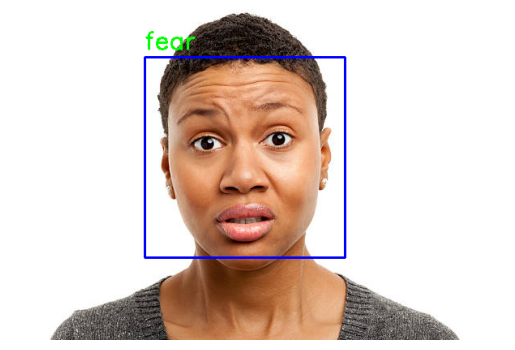

Detected Emotion: fear


In [31]:
image_path = '9.jpg'
detected_emotion = detect_and_show_emotion(image_path)
print(f"Detected Emotion: {detected_emotion}")

In [32]:
user_input = input("Describe your activity (e.g., study, workout, relax): ")
activity = detect_activity(user_input)
print(f"Detected Activity: {activity}")

Describe your activity (e.g., study, workout, relax):  study


Detected Activity: study


In [33]:
recommended_song = recommend_song(detected_emotion, activity)
print(f"Recommended Song: {recommended_song}")

if recommended_song and recommended_song != "No songs available for this combination.":
    display(Audio(recommended_song))

Recommended Song: MusicLibrary\fear\study\fear study.mp3
